Jan 25-28 Archive: 

https://www.weather.gov/mtr/AtmosphericRiver_1_26-29_2021

https://cw3e.ucsd.edu/cw3e-event-summary-26-29-january-2021/


#### download ERA5 data 
from jan 25, 2021 to jan 28

4 days - 96hrs

In [1]:
# Atmospheric River Evaluation using Aurora Forecasts (Jan 25, 2021)

from pathlib import Path
import cdsapi
import torch
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from aurora import Batch, Metadata, Aurora, rollout

In [11]:
# ------------------ SETUP ------------------
download_path = Path("~/downloads").expanduser()
download_path.mkdir(parents=True, exist_ok=True)

c = cdsapi.Client()

# Static variables
#only needs 1 day
date_key = day.replace("-", "")
if not (download_path / "static.nc").exists():
    c.retrieve(
        "reanalysis-era5-single-levels",
        {
            "product_type": "reanalysis",
            "variable": ["geopotential", "land_sea_mask", "soil_type"],
            "year": "2021", "month": "01", "day": "25",
            "time": "00:00",
            "format": "netcdf",
        },
        str(download_path / "static.nc"),
    )

# Surface-level variables
surface_file = download_path / "2021-01-25_to_28-surface-level.nc"
if not surface_file.exists():
    c.retrieve(
        "reanalysis-era5-single-levels",
        {
            "product_type": "reanalysis",
            "variable": [
                "2m_temperature",
                "10m_u_component_of_wind",
                "10m_v_component_of_wind",
                "mean_sea_level_pressure",
            ],
            "year": "2021",
            "month": "01",
            "day": ["25", "26", "27", "28"],
            "time": ["00:00", "06:00", "12:00", "18:00"],
            "format": "netcdf",
        },
        str(surface_file),
    )

# Atmospheric variables
atmos_file = download_path / f"{day}-atmospheric.nc"
atmos_file = download_path / "2021-01-25_to_28-atmospheric.nc"
if not atmos_file.exists():
    c.retrieve(
        "reanalysis-era5-pressure-levels",
        {
            "product_type": "reanalysis",
            "variable": [
                "temperature",
                "u_component_of_wind",
                "v_component_of_wind",
                "specific_humidity",
                "geopotential",
            ],
            "pressure_level": [
                "50", "100", "150", "200", "250", "300",
                "400", "500", "600", "700", "850", "925", "1000",
            ],
            "year": "2021",
            "month": "01",
            "day": ["25", "26", "27", "28"],
            "time": ["00:00", "06:00", "12:00", "18:00"],
            "format": "netcdf",
        },
        str(atmos_file),
    )

2025-07-28 16:39:44,021 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-07-28 16:39:44,884 INFO Request ID is 98c60353-846b-4ee8-9e25-520a8926bfad
2025-07-28 16:39:45,066 INFO status has been updated to accepted
2025-07-28 16:40:00,473 INFO status has been updated to running
2025-07-28 16:40:19,814 INFO status has been updated to successful


a5d2fe2fd0f4d2675be87834acd5acb3.nc:   0%|          | 0.00/105M [00:00<?, ?B/s]

2025-07-28 16:41:10,158 INFO Request ID is 17085e4c-5f2b-4b37-a6cb-2f3892150f9e
2025-07-28 16:41:10,357 INFO status has been updated to accepted
2025-07-28 16:41:15,842 INFO status has been updated to running
2025-07-28 16:47:31,625 INFO status has been updated to successful


3e966130f9030620e09d3ba04fad0e8f.nc:   0%|          | 0.00/1.61G [00:00<?, ?B/s]

In [ ]:
#add day 29


#### preprare input batch for aurora

In [12]:
# ------------------ LOAD DATA ------------------
static_vars_ds = xr.open_dataset(download_path / "static.nc")
surf_vars_ds = xr.open_dataset(surface_file)
atmos_vars_ds = xr.open_dataset(atmos_file)

batch = Batch(
    surf_vars={
        "2t": torch.from_numpy(surf_vars_ds["t2m"].values[:2][None]),
        "10u": torch.from_numpy(surf_vars_ds["u10"].values[:2][None]),
        "10v": torch.from_numpy(surf_vars_ds["v10"].values[:2][None]),
        "msl": torch.from_numpy(surf_vars_ds["msl"].values[:2][None]),
    },
    static_vars={
        "z": torch.from_numpy(static_vars_ds["z"].values[0]),
        "slt": torch.from_numpy(static_vars_ds["slt"].values[0]),
        "lsm": torch.from_numpy(static_vars_ds["lsm"].values[0]),
    },
    atmos_vars={
        "t": torch.from_numpy(atmos_vars_ds["t"].values[:2][None]),
        "u": torch.from_numpy(atmos_vars_ds["u"].values[:2][None]),
        "v": torch.from_numpy(atmos_vars_ds["v"].values[:2][None]),
        "q": torch.from_numpy(atmos_vars_ds["q"].values[:2][None]),
        "z": torch.from_numpy(atmos_vars_ds["z"].values[:2][None]),
    },
    metadata=Metadata(
        lat=torch.from_numpy(surf_vars_ds.latitude.values),
        lon=torch.from_numpy(surf_vars_ds.longitude.values),
        time=(surf_vars_ds.valid_time.values.astype("datetime64[s]").tolist()[1],),
        atmos_levels=tuple(int(level) for level in atmos_vars_ds.pressure_level.values),
    ),
)

#### run aurora predictions

4 days of IVT forecasts

In [13]:
# ------------------ RUN AURORA ------------------
model = Aurora(use_lora=False)
model.load_checkpoint("microsoft/aurora", "aurora-0.25-pretrained.ckpt")
model.eval().to("cuda")

with torch.inference_mode():
    preds = [pred.to("cpu") for pred in rollout(model, batch, steps=16)] #96hrs

model = model.to("cpu")

#### compute & plot IVT
Compute and plot IVT from both Aurora and ERA5 to visually compare atmospheric river structure

In [14]:
# ------------------ UTILITY: IVT ------------------
def compute_ivt(q, u, v, levels_hPa):
    g = 9.81
    levels_Pa = np.array(levels_hPa) * 100
    dp = -np.gradient(levels_Pa)
    qu = q * u
    qv = q * v
    ivt_u = np.sum(qu * dp[:, None, None] / g, axis=0)
    ivt_v = np.sum(qv * dp[:, None, None] / g, axis=0)
    ivt = np.sqrt(ivt_u**2 + ivt_v**2)
    return ivt, ivt_u, ivt_v

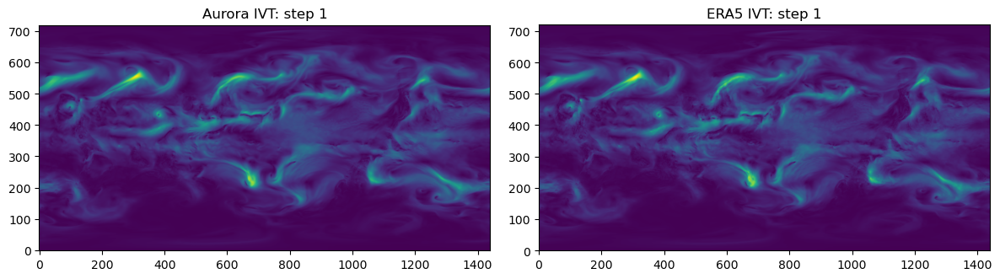

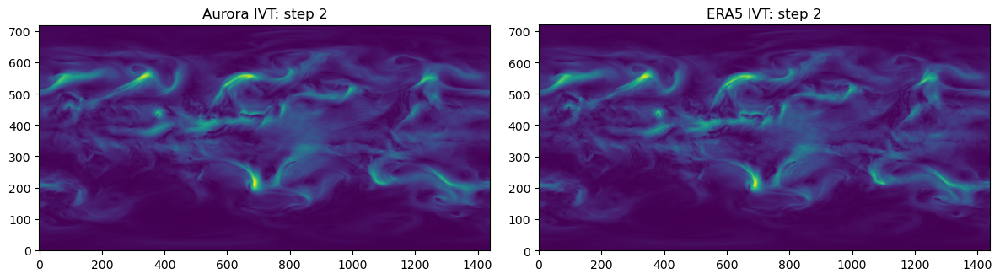

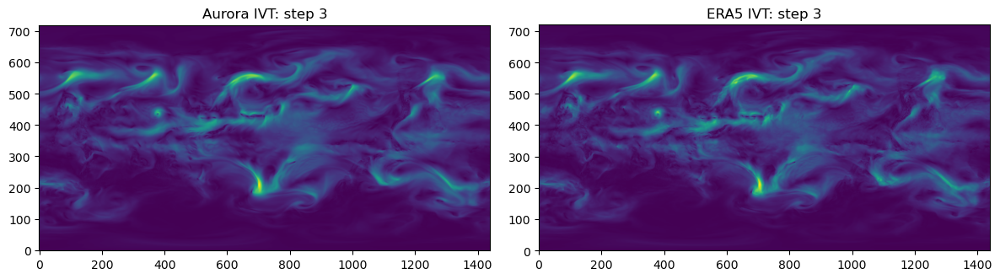

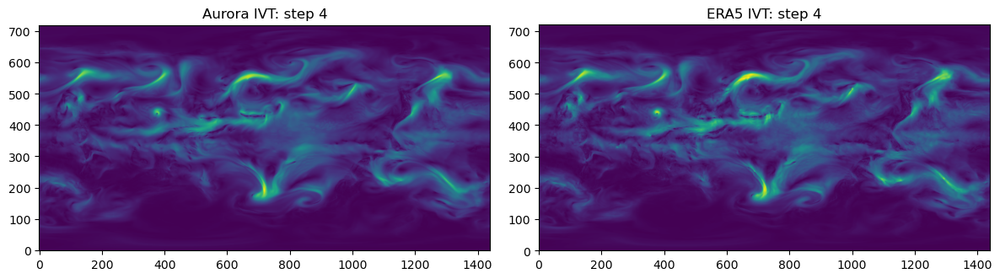

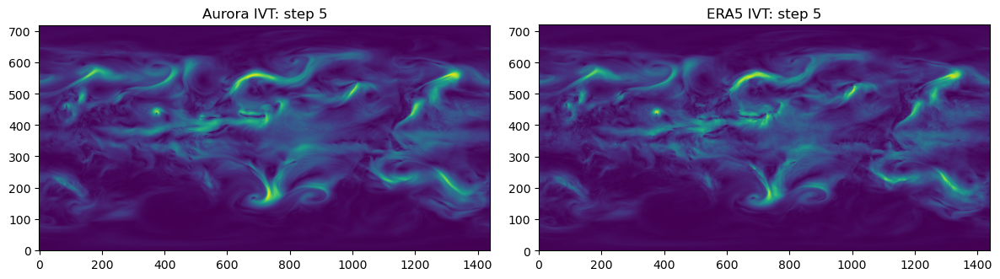

...

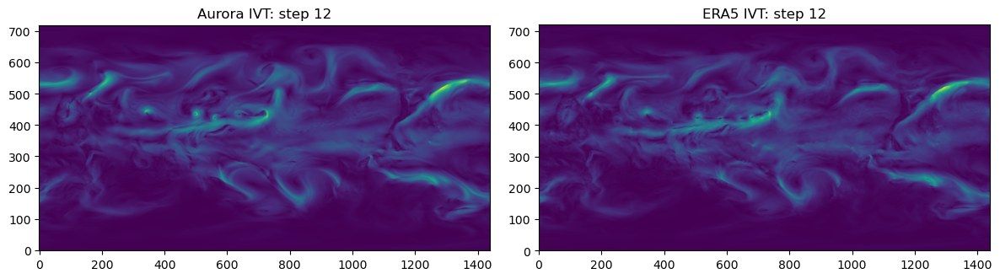

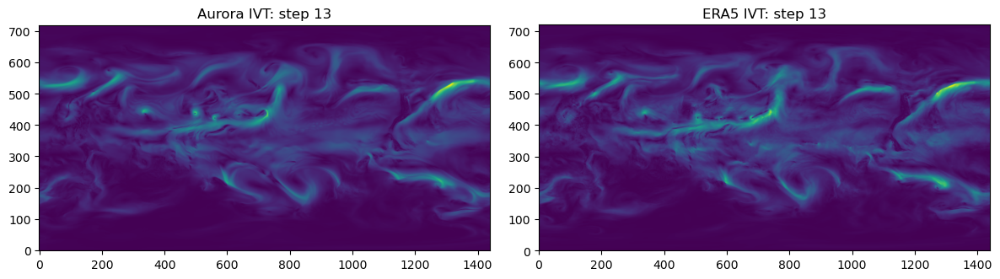

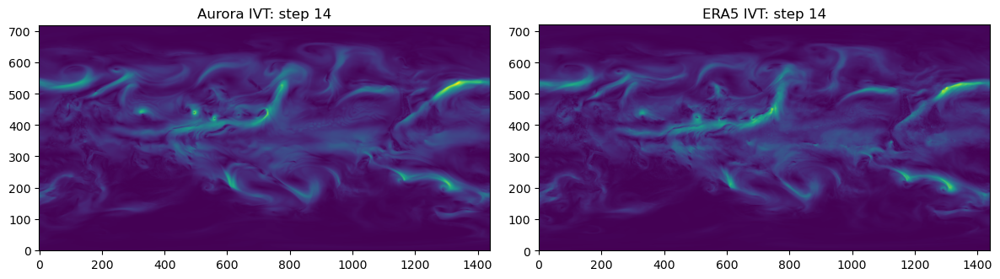

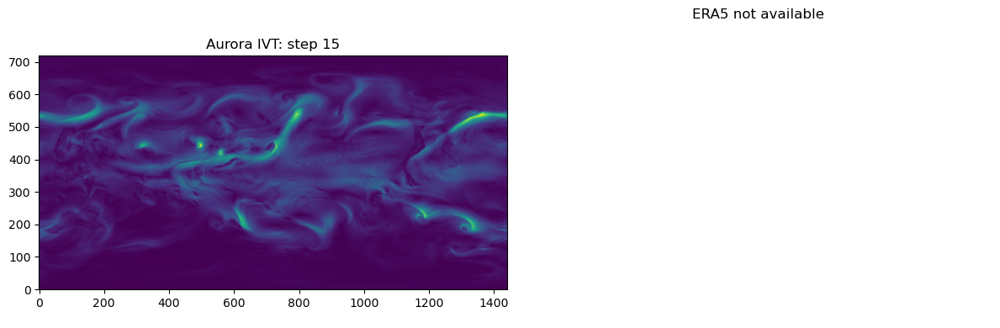

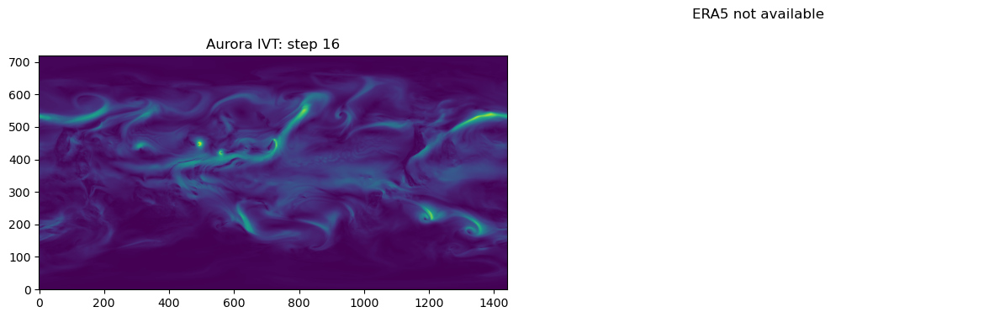

In [15]:
for i in range(len(preds)):
    pred = preds[i]

    ivt_pred, _, _ = compute_ivt(
        q=pred.atmos_vars["q"].squeeze().numpy(),
        u=pred.atmos_vars["u"].squeeze().numpy(),
        v=pred.atmos_vars["v"].squeeze().numpy(),
        levels_hPa=batch.metadata.atmos_levels
    )

    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    axs[0].imshow(ivt_pred, origin="lower", cmap="viridis")
    axs[0].set_title(f"Aurora IVT: step {i+1}")

    # Safer time check
    if (2 + i) < atmos_vars_ds["q"].shape[0]:
        q = atmos_vars_ds["q"][2 + i].values
        u = atmos_vars_ds["u"][2 + i].values
        v = atmos_vars_ds["v"][2 + i].values
        ivt_obs, _, _ = compute_ivt(q, u, v, batch.metadata.atmos_levels)

        axs[1].imshow(ivt_obs, origin="lower", cmap="viridis")
        axs[1].set_title(f"ERA5 IVT: step {i+1}")
    else:
        axs[1].axis("off")
        axs[1].set_title("ERA5 not available")

    plt.tight_layout()
    plt.show()


In [20]:
#focus on ca
lat_vals = batch.metadata.lat.numpy()
lon_vals = batch.metadata.lon.numpy()

lat_idx = np.where((lat_vals >= 20) & (lat_vals <= 50))[0]
lon_idx = np.where((lon_vals >= 220) & (lon_vals <= 250))[0]

In [21]:
ivt_series = []
for i in range(len(preds)):
    pred = preds[i]
    ivt_pred, _, _ = compute_ivt(
        q=pred.atmos_vars["q"].squeeze().numpy(),
        u=pred.atmos_vars["u"].squeeze().numpy(),
        v=pred.atmos_vars["v"].squeeze().numpy(),
        levels_hPa=batch.metadata.atmos_levels
    )
    ivt_crop = ivt_pred[np.ix_(lat_idx, lon_idx)]
    ivt_series.append(ivt_crop)


In [ ]:
ivt_obs_series = []
for i in range(len(preds)):
    if (2 + i) < atmos_vars_ds["q"].shape[0]:
        q = atmos_vars_ds["q"][2 + i].values
        u = atmos_vars_ds["u"][2 + i].values
        v = atmos_vars_ds["v"][2 + i].values
        ivt_obs, _, _ = compute_ivt(q, u, v, batch.metadata.atmos_levels)
        ivt_crop = ivt_obs[np.ix_(lat_idx, lon_idx)]
        ivt_obs_series.append(ivt_crop)
    else:
        ivt_obs_series.append(None)

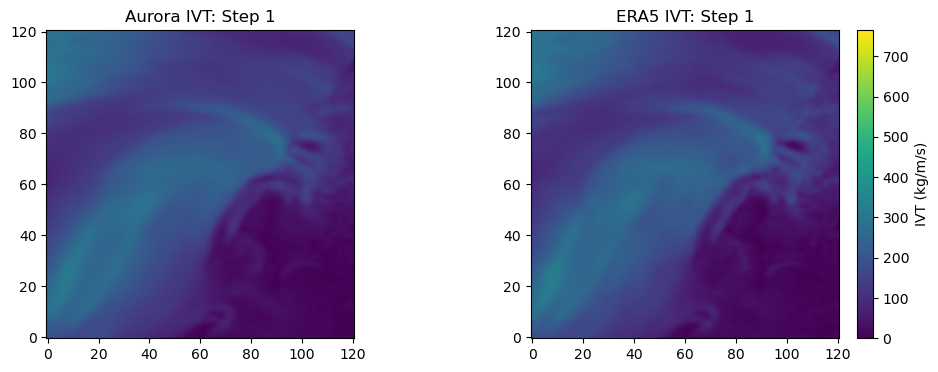

In [25]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
im1 = axs[0].imshow(ivt_series[0], origin="lower", cmap="viridis", vmin=0, vmax=np.max(ivt_series))
im2 = axs[1].imshow(ivt_obs_series[0] if ivt_obs_series[0] is not None else np.zeros_like(ivt_series[0]), origin="lower", cmap="viridis", vmin=0, vmax=np.max(ivt_series))

# Add colorbar
cbar = fig.colorbar(im1, ax=axs, orientation='vertical', fraction=0.025, pad=0.02)
cbar.set_label("IVT (kg/m/s)")

axs[0].set_title("Aurora IVT")
axs[1].set_title("ERA5 IVT")

def update_frame(i):
    im1.set_array(ivt_series[i])
    if ivt_obs_series[i] is not None:
        im2.set_array(ivt_obs_series[i])
        axs[1].set_title(f"ERA5 IVT: Step {i+1}")
    else:
        im2.set_array(np.zeros_like(ivt_series[i]))
        axs[1].set_title("ERA5 IVT: Not Available")
    axs[0].set_title(f"Aurora IVT: Step {i+1}")
    return [im1, im2]

anim = FuncAnimation(fig, update_frame, frames=len(ivt_series), interval=500)
HTML(anim.to_jshtml())

In [26]:
rmse_list = []
bias_list = []
valid_steps = []

for i in range(len(ivt_series)):
    ivt_pred = ivt_series[i]
    ivt_obs = ivt_obs_series[i]

    if ivt_obs is not None:
        rmse = np.sqrt(np.mean((ivt_pred - ivt_obs)**2))
        bias = np.mean(ivt_pred - ivt_obs)

        rmse_list.append(rmse)
        bias_list.append(bias)
        valid_steps.append(i + 1)  # step number


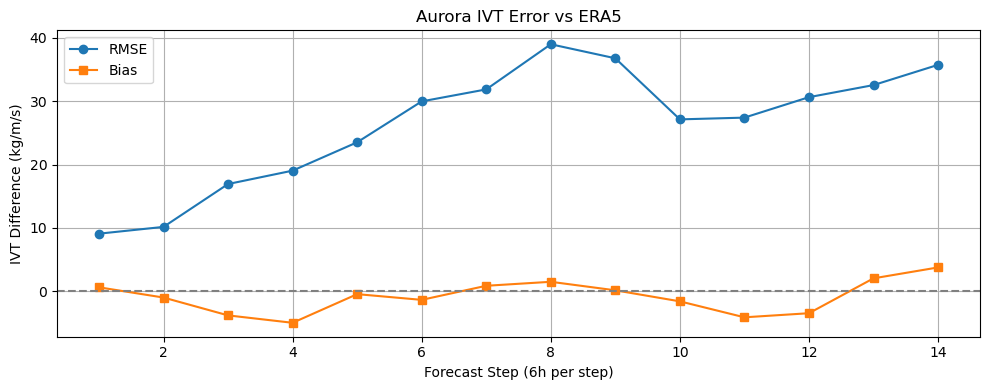

In [27]:
plt.figure(figsize=(10, 4))
plt.plot(valid_steps, rmse_list, label="RMSE", marker='o')
plt.plot(valid_steps, bias_list, label="Bias", marker='s')
plt.axhline(0, color='gray', linestyle='--')
plt.xlabel("Forecast Step (6h per step)")
plt.ylabel("IVT Difference (kg/m/s)")
plt.title("Aurora IVT Error vs ERA5")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


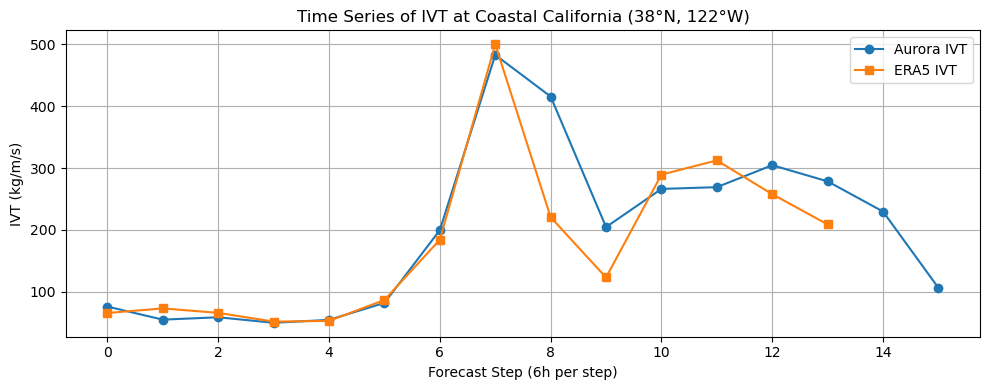

In [29]:
# Redefine based on cropped lat/lon values
lat_crop = lat_vals[lat_idx]
lon_crop = lon_vals[lon_idx]

# Pick a reference point inside the zoomed region
lat_point = 38  # degrees N
lon_point = -122  # degrees W → 360 - 122 = 238

# Get index within cropped region
lat_idx_pt = np.argmin(np.abs(lat_crop - lat_point))
lon_idx_pt = np.argmin(np.abs(lon_crop - (360 + lon_point)))  # still 0–360

# Extract time series
ivt_pred_ts = [ivt[lat_idx_pt, lon_idx_pt] for ivt in ivt_series]
ivt_obs_ts = [ivt[lat_idx_pt, lon_idx_pt] if ivt is not None else np.nan for ivt in ivt_obs_series]


# Plot comparison
plt.figure(figsize=(10, 4))
plt.plot(ivt_pred_ts, label="Aurora IVT", marker="o")
plt.plot(ivt_obs_ts, label="ERA5 IVT", marker="s")
plt.xlabel("Forecast Step (6h per step)")
plt.ylabel("IVT (kg/m/s)")
plt.title("Time Series of IVT at Coastal California (38°N, 122°W)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

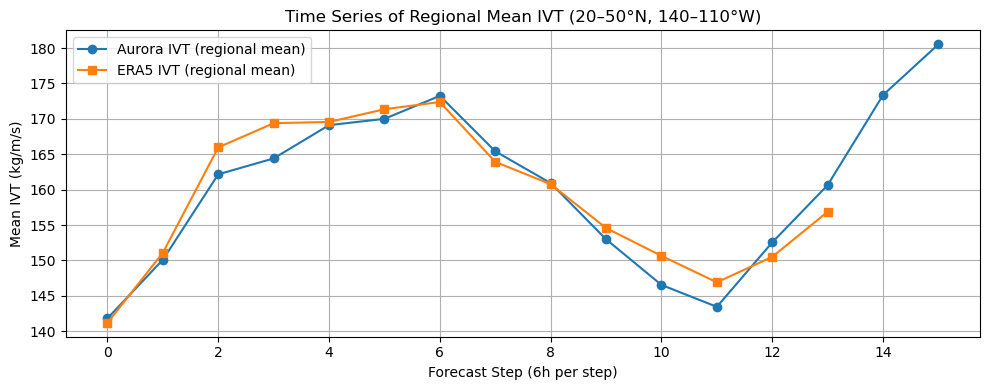

In [30]:
# Compute time series of regional mean IVT
ivt_pred_ts = [np.mean(ivt) for ivt in ivt_series]
ivt_obs_ts = [np.mean(ivt) if ivt is not None else np.nan for ivt in ivt_obs_series]

# Plot comparison
plt.figure(figsize=(10, 4))
plt.plot(ivt_pred_ts, label="Aurora IVT (regional mean)", marker="o")
plt.plot(ivt_obs_ts, label="ERA5 IVT (regional mean)", marker="s")
plt.xlabel("Forecast Step (6h per step)")
plt.ylabel("Mean IVT (kg/m/s)")
plt.title("Time Series of Regional Mean IVT (20–50°N, 140–110°W)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
